**Author: Svenja Gaedcke**  
gaedcke.svenja@mh-hannover.de  
06.12.2021  

# Setup

In [1]:
%matplotlib inline
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import sys
import os
import numpy as np
import pandas as pd
import scanpy as sc
import datetime
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sb

#Read config file
import configparser as config
config = config.ConfigParser()
config.read('./config.ini')
#os.chdir(config['PATHS']["OUTPUT"])

sc.settings.verbosity = 0         
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100)
sc.settings.figdir = config['PATHS']["OUTPUT"]+"/figs/smallerClusters_"
sc._settings.n_jobs = 5
sc._settings.max_memory = 80 #GB
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=150,
                         frameon=True, vector_friendly=True, 
                         fontsize=14, color_map=None, format='pdf',
                         transparent=True )
sc._settings.savefigs = False

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.21.5 scipy==1.7.3 pandas==1.1.2 scikit-learn==1.0.2 statsmodels==0.12.0 python-igraph==0.8.2 louvain==0.7.0 leidenalg==0.7.0


# PT cells

In [2]:
adata_pt = sc.read(config['PATHS']["OUTPUT"]+"/sc_pt_newUmap.h5ad")
adata_pt

AnnData object with n_obs × n_vars = 3651 × 20514
    obs: 'sample', 'sample_description', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts', 'percent_mito', 'predicted_doublets', 'doublet_scores', 'louvain', 'n_counts_log', 'celltype', 'louvain_rdef'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'celltype_colors', "dendrogram_['louvain']", 'dendrogram_louvain', 'louvain', 'louvain_colors', 'neighbors', 'neighbors_harmony', 'pca', 'rank_genes_groups', 'sample_colors', 'sample_description_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', '

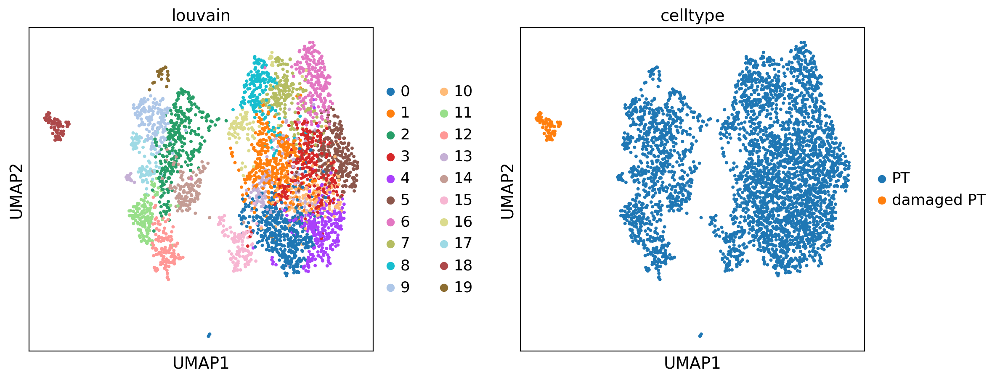

In [3]:
rcParams['figure.figsize'] = 5,5
sc.tl.louvain(adata_pt) #resolution default is 1!
sc.pl.umap(adata_pt, color=['louvain', "celltype"], wspace=0.3)
#sc.pl.umap(adata_pt, color=['sample_description'], wspace=0.3, save="_sc_pt_sample.pdf")

In [4]:
#adata_pt = sc.read(config['PATHS']["OUTPUT"]+"/sc_pt_newUmap.h5ad")
#adata_pt.write(config['PATHS']["OUTPUT"]+"/sc_pt_newUmap.h5ad")

# Identify Clusters 
using Genes from Kirita, Yuhei, et al. "Cell profiling of mouse acute kidney injury reveals conserved cellular responses to injury." bioRxiv (2020).  
Supplements 2: GDE Table: CLuster - Gene   
Annotation of Cluster with Figure 2.A

In [5]:
import pandas as pd
kirita = pd.read_excel(config['PATHS']["DATA_KIRITA"]+"/pnas.2005477117.sd02.xlsx",
                       sheet_name= "MousePT_DEG")
print("before filtering logFC >0.584: ",kirita.shape)
kirita = kirita[kirita["avg_logFC"] >= 0.584] #FC > 1.5
print("after filtering logFC >0.584: ",kirita.shape)

before filtering logFC >0.584:  (3097, 8)
after filtering logFC >0.584:  (953, 8)


In [6]:
kirita_markers = kirita[["gene", "cluster"]]
kirita_markers.replace(1, "Healthy S1", inplace=True)
kirita_markers.replace(2, "Healthy S2", inplace=True)
kirita_markers.replace(3, "Healthy S3", inplace=True)
kirita_markers.replace(4, "Repairing PT", inplace=True)
kirita_markers.replace(5, "Injured S1/2", inplace=True)
kirita_markers.replace(6, "Injured S3", inplace=True)
kirita_markers.replace(7, "Severe Injured PT", inplace=True)
kirita_markers.replace(8, "Failed repair PT", inplace=True)
kirita_markers.drop_duplicates()

kirita_markers_dict = {}
for group in np.unique(kirita_markers.cluster):
    kirita_markers_dict[group] = set(kirita_markers[kirita_markers.cluster == group].gene)

{key: len(value) for key, value in kirita_markers_dict.items()}

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/pandas/core/frame.py:4384: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,


{'Failed repair PT': 142,
 'Healthy S1': 81,
 'Healthy S2': 82,
 'Healthy S3': 195,
 'Injured S1/2': 67,
 'Injured S3': 150,
 'Repairing PT': 23,
 'Severe Injured PT': 213}

                     0     1     2    3    4    5    6    7    8     9   10  \
Failed repair PT   1.0   0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0   
Healthy S1         7.0   0.0   3.0  0.0  1.0  3.0  4.0  1.0  1.0   3.0  9.0   
Healthy S2         2.0   7.0  10.0  0.0  0.0  0.0  1.0  3.0  5.0   8.0  1.0   
Healthy S3         1.0  10.0   9.0  0.0  1.0  1.0  0.0  0.0  6.0   5.0  1.0   
Injured S1/2       0.0   0.0   1.0  1.0  1.0  1.0  2.0  1.0  0.0   1.0  1.0   
Injured S3         0.0   1.0   0.0  0.0  0.0  0.0  0.0  0.0  1.0   0.0  0.0   
Repairing PT       0.0   0.0   1.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0   
Severe Injured PT  1.0   3.0   2.0  3.0  3.0  1.0  2.0  4.0  4.0  10.0  2.0   

                     11   12   13    14   15   16   17   18    19  
Failed repair PT    1.0  1.0  1.0   1.0  3.0  1.0  1.0  2.0   1.0  
Healthy S1         12.0  7.0  8.0  11.0  5.0  0.0  4.0  0.0   0.0  
Healthy S2          6.0  8.0  4.0   4.0  3.0  5.0  6.0  0.0   4.0  
Healthy S3      

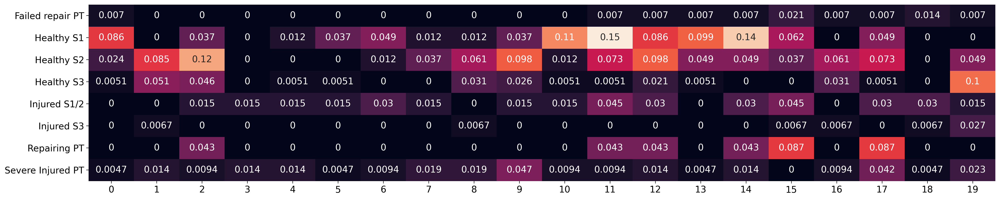

In [7]:
sc.tl.rank_genes_groups(adata_pt, groupby="louvain")
print(sc.tl.marker_gene_overlap(adata_pt, kirita_markers_dict, top_n_markers = 50))
cell_annotation_norm = sc.tl.marker_gene_overlap(adata_pt, kirita_markers_dict, 
    normalize='reference',top_n_markers = 50)
plt.rcParams['figure.figsize']=(25,5)
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)
fig_dic = config['PATHS']["OUTPUT"]+"/figs/smallerClusters_"
#plt.savefig(fig_dic+"_sc_compasrion_clusters_kirita.png", dpi=400)

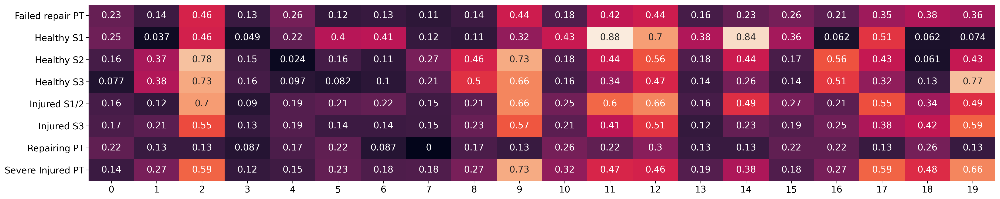

In [8]:
sc.tl.rank_genes_groups(adata_pt, groupby="louvain")
cell_annotation_norm = sc.tl.marker_gene_overlap(adata_pt, kirita_markers_dict, 
                                                 normalize='reference',adj_pval_threshold = 0.05)
plt.rcParams['figure.figsize']=(25,5)
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)
fig_dic = config['PATHS']["OUTPUT"]+"/figs/smallerClusters_"
#plt.savefig(fig_dic+"_sc_compasrion_clusters_kirita_pval005.png", dpi=400)

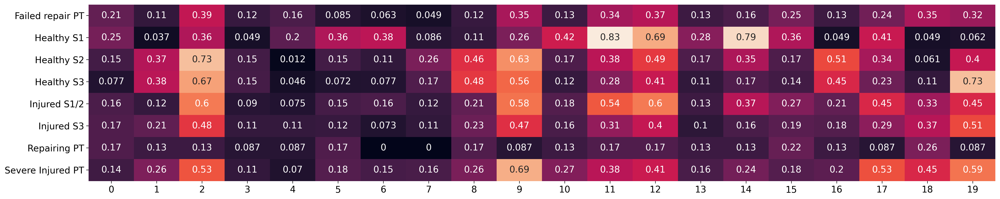

In [9]:
sc.tl.rank_genes_groups(adata_pt, groupby="louvain")
cell_annotation_norm = sc.tl.marker_gene_overlap(adata_pt, kirita_markers_dict, 
                                                 normalize='reference',adj_pval_threshold = 0.01)
plt.rcParams['figure.figsize']=(25,5)
sb.heatmap(cell_annotation_norm, cbar=False, annot=True)
fig_dic = config['PATHS']["OUTPUT"]+"/figs/smallerClusters_"
#plt.savefig(fig_dic+"_sc_compasrion_clusters_kirita_pval001.png", dpi=400)

# lable cells with categorie from PNA S Paper   
https://doi.org/10.1073/pnas.2005477117
Defining DGEs are available in supplemental Dataset S03

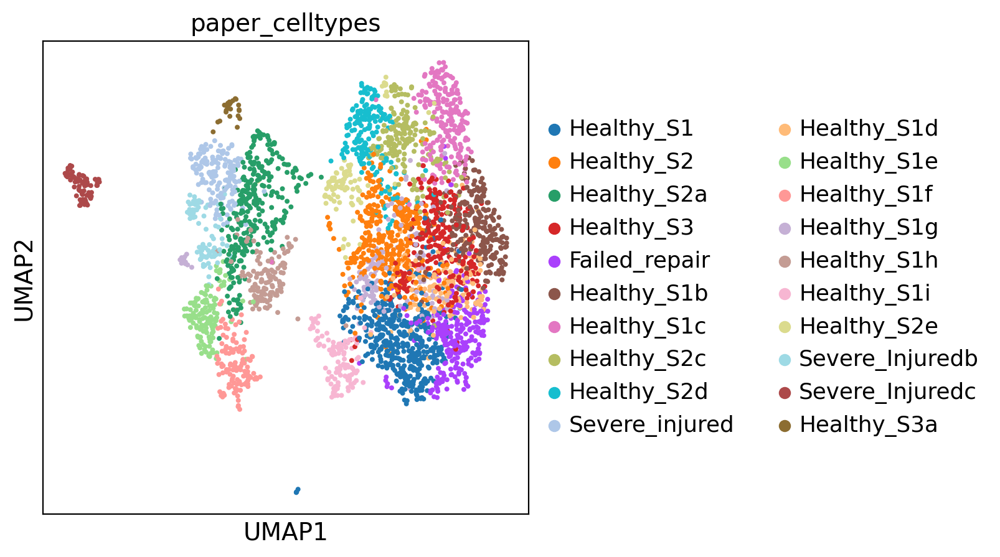

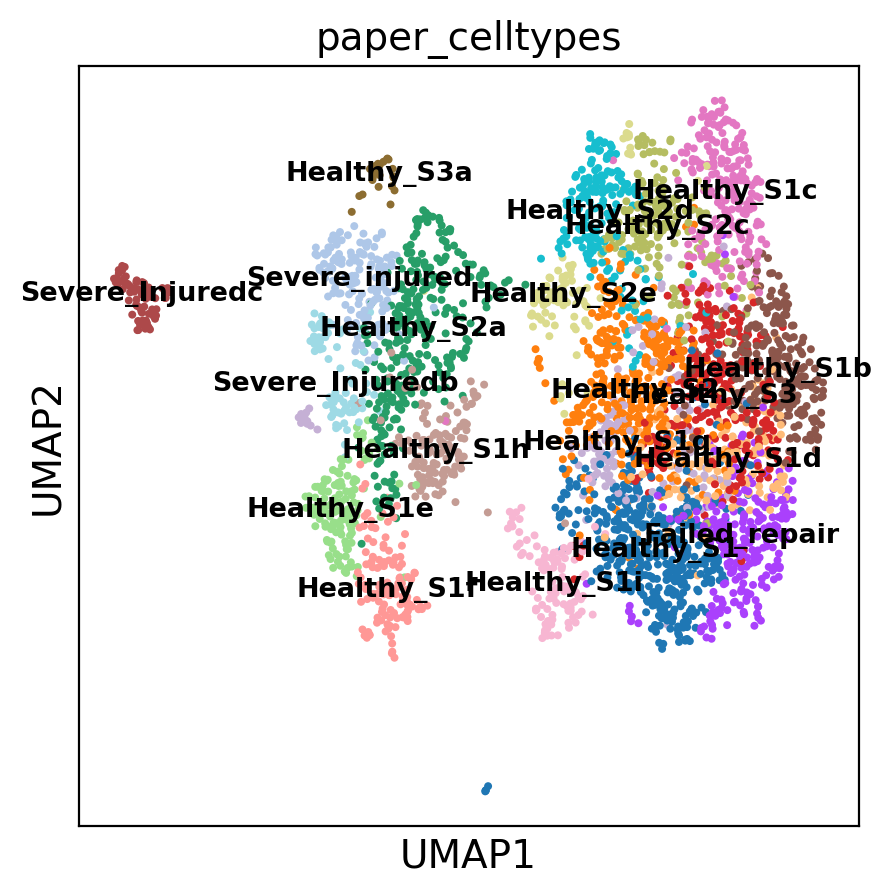

In [10]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize']=(5,5)
adata_pt.obs["paper_celltypes"] = adata_pt.obs.louvain
new_cluster_names = [
    'Healthy_S1', 'Healthy_S2',
    'Healthy_S2a', 'Healthy_S3',
    'Failed_repair', 'Healthy_S1b',
    'Healthy_S1c', 'Healthy_S2c',
    'Healthy_S2d', 'Severe_injured',
    'Healthy_S1d', 'Healthy_S1e', 
    "Healthy_S1f", "Healthy_S1g",
"Healthy_S1h", "Healthy_S1i", #14
"Healthy_S2e", "Severe_Injuredb",
"Severe_Injuredc", "Healthy_S3a"]
adata_pt.rename_categories('paper_celltypes', new_cluster_names)

sc.pl.umap(adata_pt, color="paper_celltypes")
sc.pl.umap(adata_pt, color="paper_celltypes", legend_loc="on data", legend_fontsize="x-small")

In [11]:
print("number of genes used to identify celltypes:")
kirita.groupby("cluster").count()["gene"]

number of genes used to identify celltypes:


cluster
1     81
2     82
3    195
4     23
5     67
6    150
7    213
8    142
Name: gene, dtype: int64

avg Expression


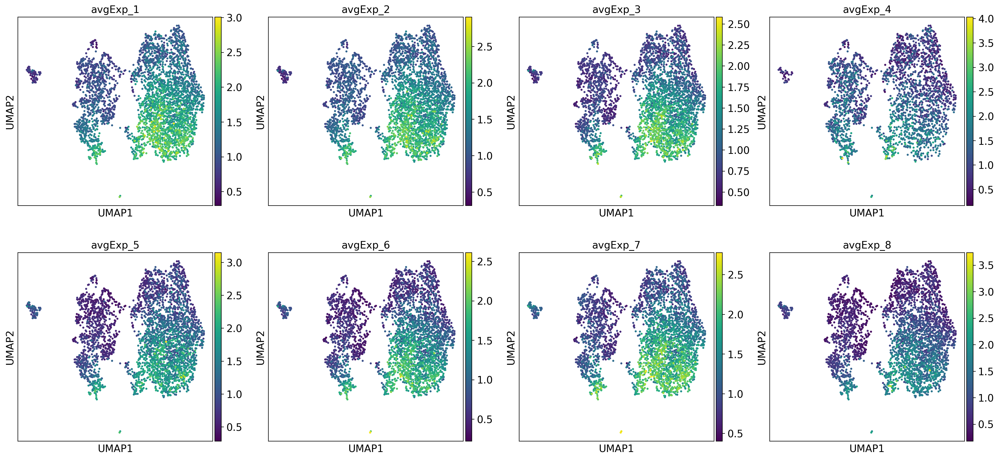

Sum Expression


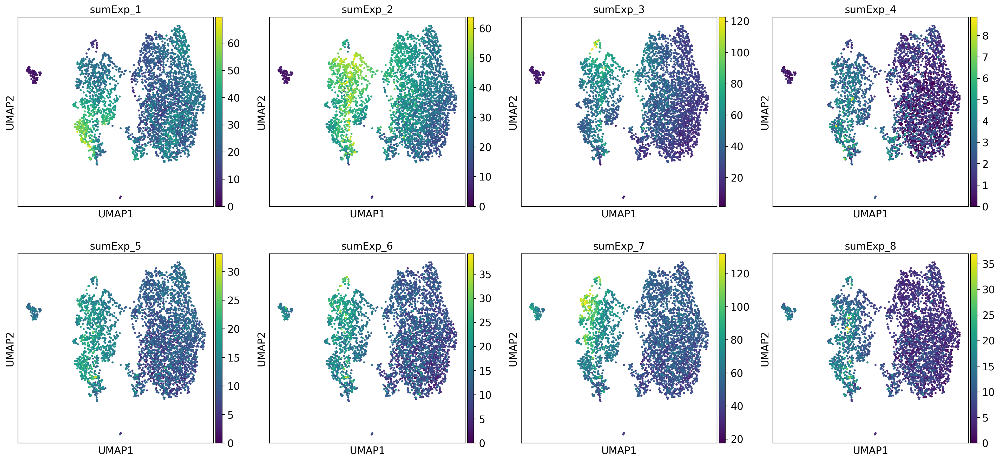

avg Expression (all)


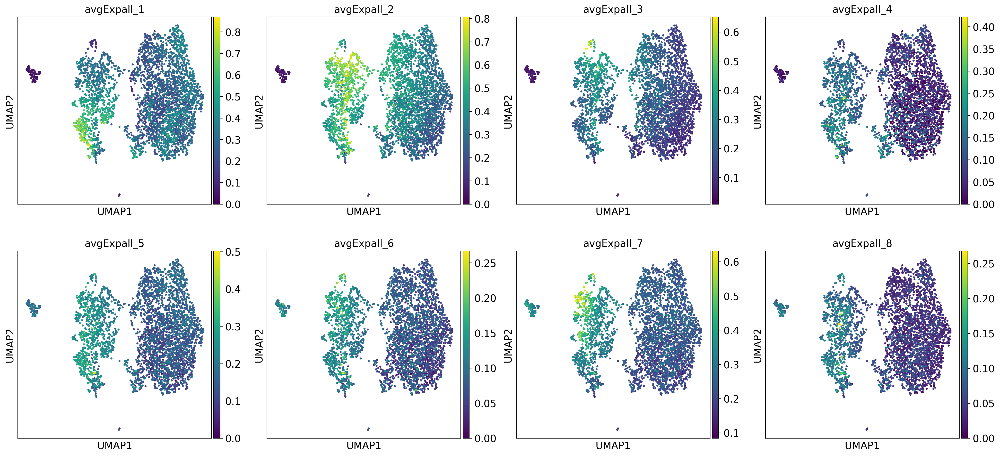

In [12]:
kirita_lists = kirita.groupby("cluster")["gene"].apply(list) # get list of markers for cluster1: kirita_lists[1]
for l, liste in enumerate(kirita_lists,1):
    #print("cluster "+str(l)+":")
    tmp = []
    for gen in kirita_lists[l]:
        if  gen in adata_pt.var_names:          
            tmp.append(gen)
    kirita_lists[l] = tmp
    del(tmp)
    adata_pt.obs["sumExp_"+str(l)] = 0
    index_list = adata_pt[:, kirita_lists[l]].obs.index
    adata_pt.obs.loc[adata_pt.obs.index.isin(index_list), "sumExp_"+str(l)] = adata_pt[:, kirita_lists[l]].X.sum(axis=1)
    adata_pt.obs["countExp_"+str(l)] = 0
    adata_pt.obs.loc[adata_pt.obs.index.isin(index_list), "countExp_"+str(l)] = (adata_pt[:, kirita_lists[l]].X != 0).sum(axis=1)
    adata_pt.obs["avgExp_"+str(l)] = adata_pt.obs["sumExp_"+str(l)]/adata_pt.obs["countExp_"+str(l)]
    adata_pt.obs["avgExpall_"+str(l)] = adata_pt.obs["sumExp_"+str(l)]/len(kirita_lists[l])
    
print("avg Expression")
sc.pl.umap(adata_pt, color=['avgExp_1','avgExp_2', 'avgExp_3', 'avgExp_4', 'avgExp_5', 'avgExp_6', 'avgExp_7', 'avgExp_8'])
print("Sum Expression")
sc.pl.umap(adata_pt, color=['sumExp_1', 'sumExp_2', 'sumExp_3','sumExp_4', 'sumExp_5', 'sumExp_6', 'sumExp_7','sumExp_8'])
print("avg Expression (all)")
sc.pl.umap(adata_pt, color=['avgExpall_1','avgExpall_2', 'avgExpall_3', 'avgExpall_4', 'avgExpall_5', 'avgExpall_6', 'avgExpall_7', 'avgExpall_8'])

# Merge clusters

In [13]:
old_to_new = dict(   
    Healthy_S1='Healthy_S1', 
    Healthy_S2='Healthy_S2',
    Healthy_S2a='Healthy_S2',
    Healthy_S3='Healthy_S3',
    Failed_repair='Failed_repair', 
    Healthy_S1b='Healthy_S1',
    Healthy_S1c='Healthy_S1', 
    Healthy_S2c='Healthy_S2',
    Healthy_S2d='Healthy_S2', 
    Severe_injured='Severe_injured',
    Healthy_S1d='Healthy_S1', 
    Healthy_S1e='Healthy_S1', 
    Healthy_S1f="Healthy_S1", 
    Healthy_S1g="Healthy_S1",
    Healthy_S1h="Healthy_S1", 
    Healthy_S1i="Healthy_S1", 
    Healthy_S2e="Healthy_S2",
    Severe_Injuredb="Severe_injured",
    Severe_Injuredc="Severe_injured", 
    Healthy_S3a="Healthy_S3"   
)

adata_pt.obs['paper_celltypes_merged'] = (
    adata_pt.obs['paper_celltypes']
    .map(old_to_new)
    .astype('category')
)

In [14]:
celltypes = ['Failed_repair', 'Healthy_S1', 'Healthy_S2', 'Healthy_S3', 'Injured',"Severe_injured", "Reparing"]
colors=['#4334eb', '#43eb34', '#279e68', '#072e03', '#eb3434', '#591313', "#037ffc"]
colors = dict(zip(celltypes, colors))
adata_pt.uns["paper_celltypes_merged_colors"] = [colors[c] for c in adata_pt.obs.paper_celltypes_merged.cat.categories]

#adata_pt.write(config['PATHS']["OUTPUT"]+"sc_pt_annotated_smallerCLuster.h5ad")

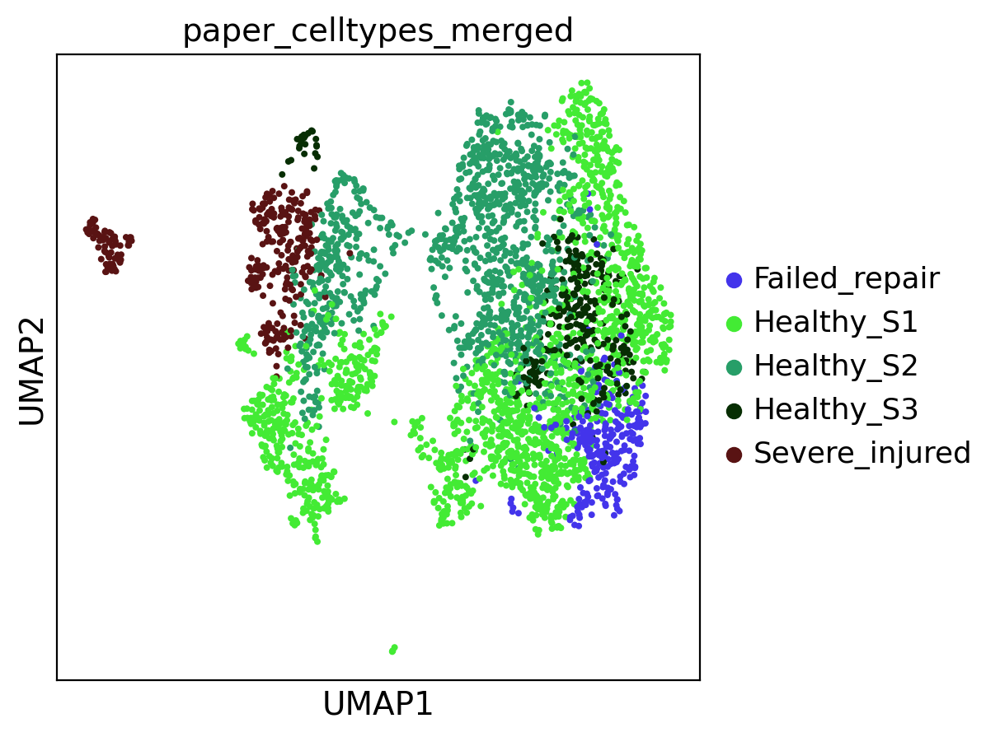

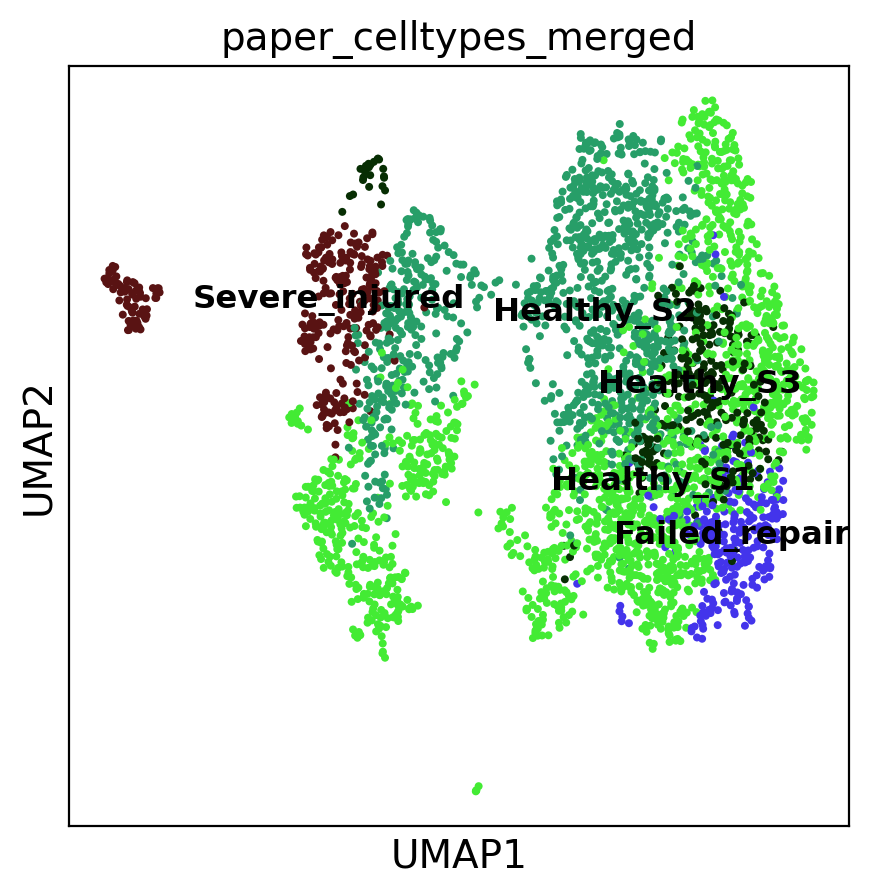

In [15]:
sc.pl.umap(adata_pt, color="paper_celltypes_merged")#, save="_sc_pt_celltypes")
sc.pl.umap(adata_pt, color="paper_celltypes_merged", legend_loc="on data", legend_fontsize="small")

Numbers of cells per celltype:
others (smaller groups): 
Empty DataFrame
Columns: [paper_celltypes_merged, sample]
Index: []
                       paper_celltypes_merged  cells       %
paper_celltypes_merged                                      
Failed_repair                   Failed_repair    259   7.09%
Healthy_S1                         Healthy_S1   1686  46.18%
Healthy_S2                         Healthy_S2   1101  30.16%
Healthy_S3                         Healthy_S3    294   8.05%
Severe_injured                 Severe_injured    311   8.52%


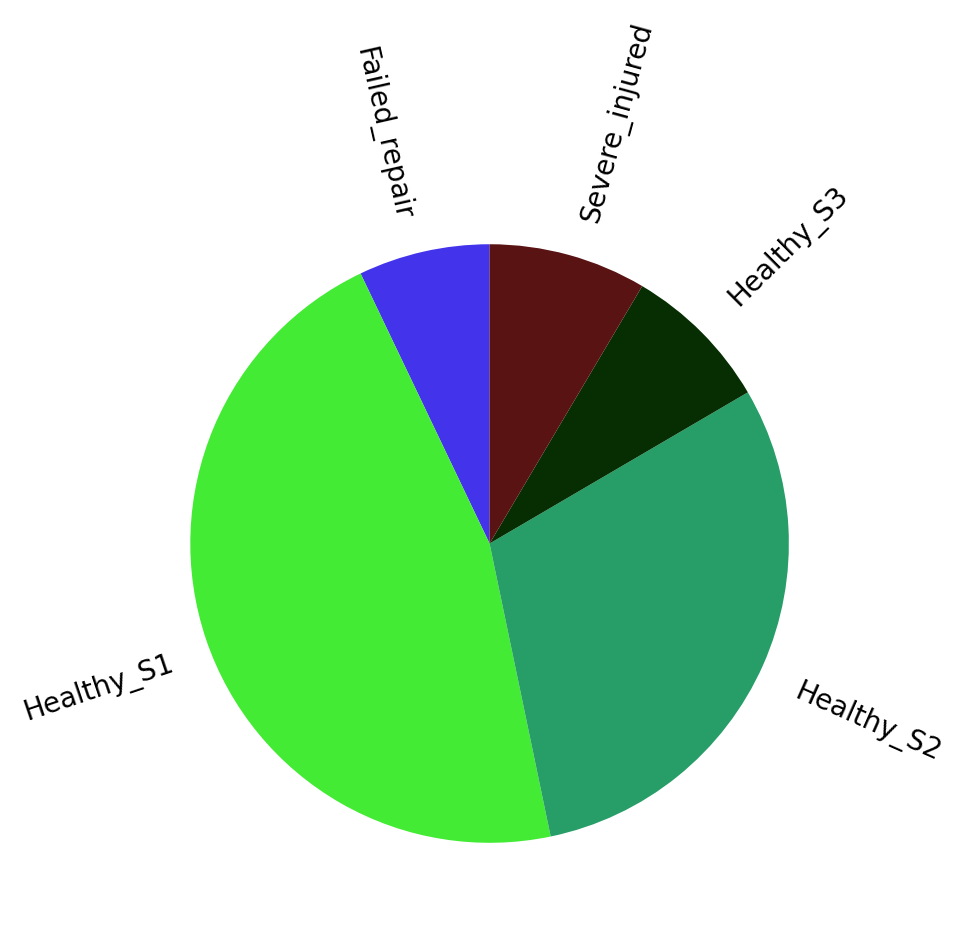

In [16]:
print("Numbers of cells per celltype:")
counts = adata_pt.obs.groupby(["paper_celltypes_merged"]).count()["sample"].reset_index()
counts = counts.sort_values("paper_celltypes_merged")
print("others (smaller groups): ")
print(counts[(counts['sample'] < 5)])
counts.columns = ["paper_celltypes_merged","cells"]
counts.index = counts.paper_celltypes_merged
counts['%'] = ((counts['cells'] / counts['cells'].sum())*100).round(2).astype(str) + '%'
print(counts)

fig1, ax1 = plt.subplots()
ax1.pie(counts["cells"], labels=counts["paper_celltypes_merged"],rotatelabels=45, 
         startangle=90,  textprops={'fontsize': 10}, colors=[colors[d] for d in counts["paper_celltypes_merged"]])
ax1.axis('equal')  
#plt.savefig( config['PATHS']["OUTPUT"]+"/figs/sc_pt_piechart_smallerCLusters.pdf",facecolor = 'white', dpi=600, bbox_inches='tight')
plt.tight_layout()
plt.show()

# UMAP colored by gene expressions

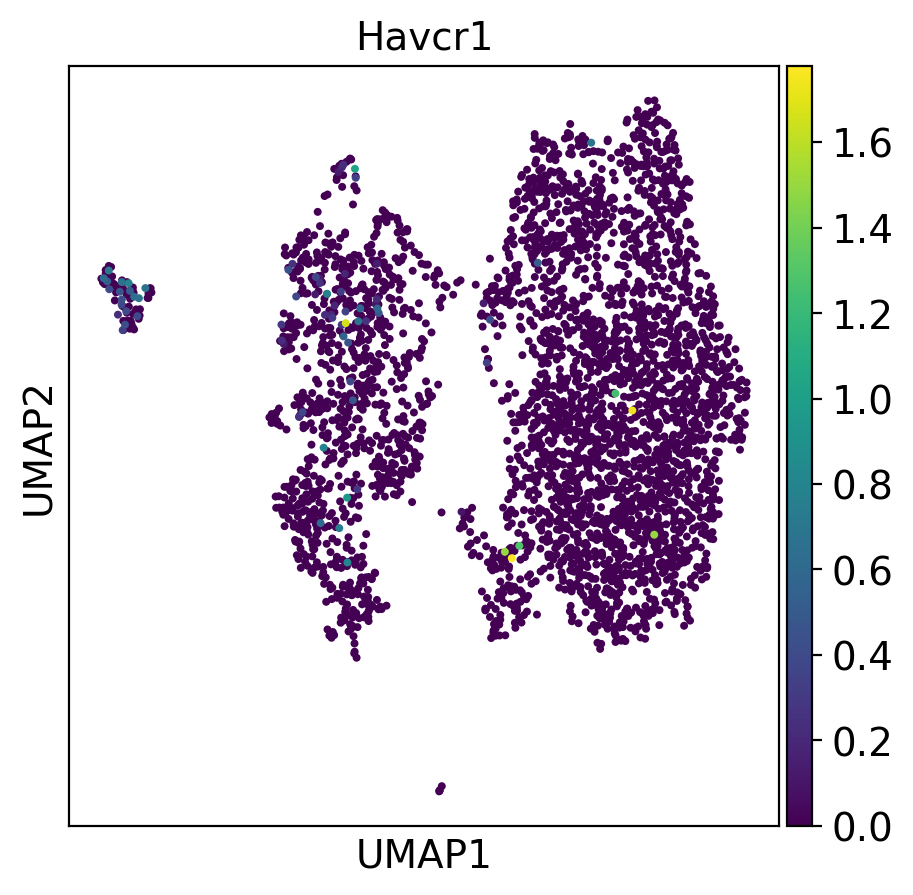

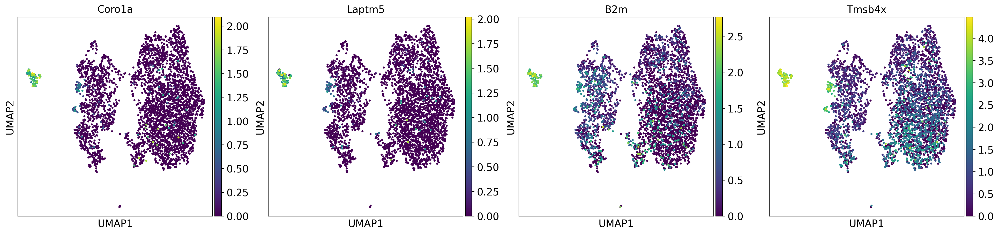

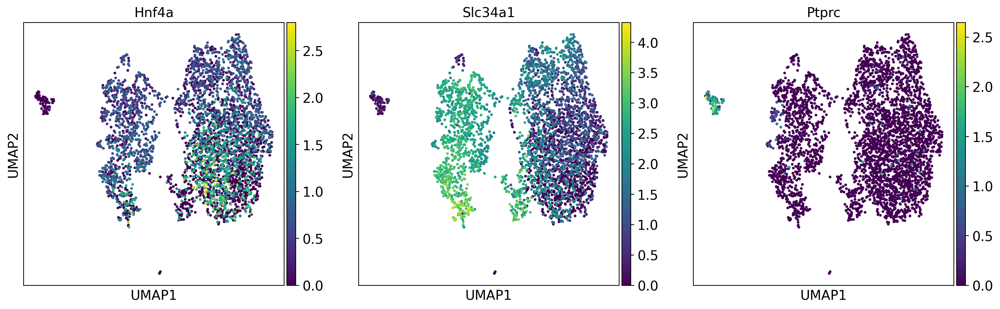

In [17]:
sc.pl.umap(adata_pt, color=['Havcr1'])#, save="_sc_pt_havcr.pdf")
sc.pl.umap(adata_pt, color=['Coro1a', "Laptm5", "B2m","Tmsb4x"])
sc.pl.umap(adata_pt, color=["Hnf4a","Slc34a1","Ptprc"])

# Marker gene detection per CLuster

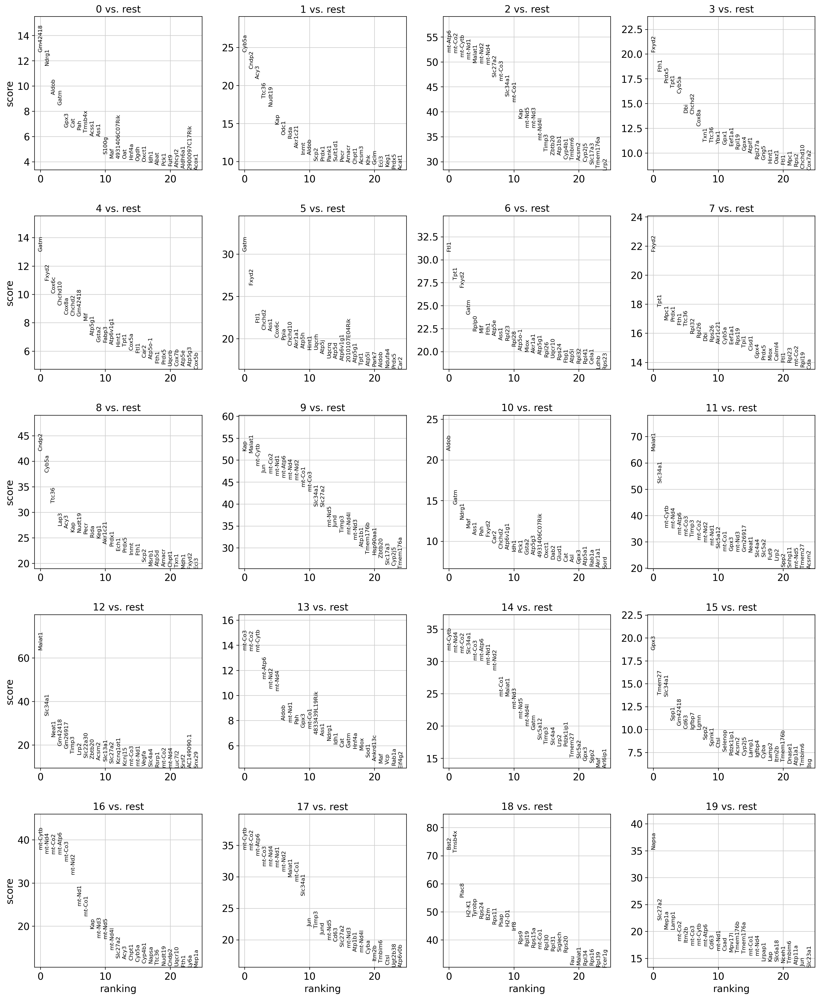

In [18]:
sc.tl.rank_genes_groups(adata_pt, 'louvain')
sc.pl.rank_genes_groups(adata_pt, n_genes=25, sharey=False)

# Transkript-level

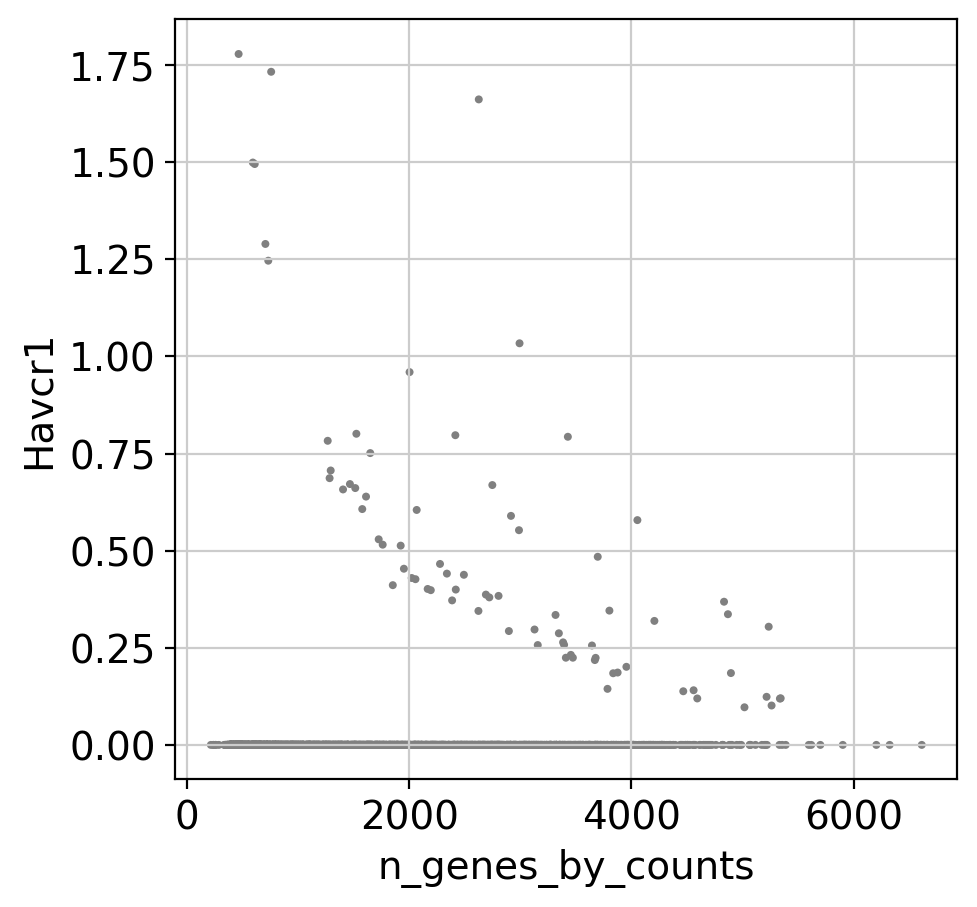

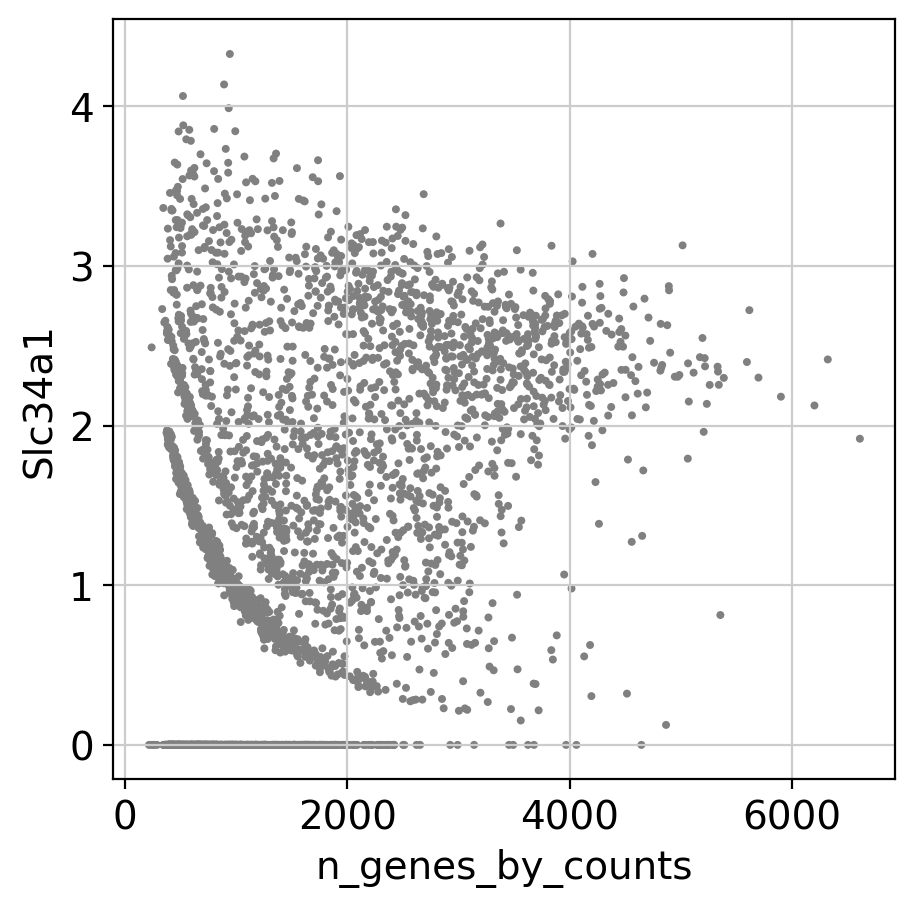

In [19]:
sc.pl.scatter(adata_pt, y="Havcr1", x="n_genes_by_counts")
sc.pl.scatter(adata_pt, y="Slc34a1", x="n_genes_by_counts")

In [20]:
sc.pp.calculate_qc_metrics(adata_pt, inplace=False, use_raw=True)[1].loc[["Havcr1","Slc34a1"]]

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
Havcr1,76,0.010771,0.010713,97.918379,39.324169,3.696951
Slc34a1,2613,1.356593,0.857217,28.430567,4952.921875,8.507935


In [21]:
np.mean(adata_pt.obs.n_genes_by_counts)

1621.3352506162696

In [22]:
np.mean(adata_pt.obs.total_counts)

4843.8716

In [23]:
adata_pt.var.total_counts

Xkr4                  9.0
Gm37381               6.0
Rp1                 817.0
Sox17              2686.0
Gm37323               7.0
                   ...   
AC125149.3           17.0
AC168977.1           45.0
AC149090.1        11042.0
CAAA01118383.1     5679.0
CAAA01147332.1      282.0
Name: total_counts, Length: 20514, dtype: float32

Number of expressed Genes in PT:

In [24]:
print(adata_pt)
sum(sc.pp.filter_genes(adata_pt, inplace=False, min_cells=1)[0])

AnnData object with n_obs × n_vars = 3651 × 20514
    obs: 'sample', 'sample_description', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts', 'percent_mito', 'predicted_doublets', 'doublet_scores', 'louvain', 'n_counts_log', 'celltype', 'louvain_rdef', 'paper_celltypes', 'sumExp_1', 'countExp_1', 'avgExp_1', 'avgExpall_1', 'sumExp_2', 'countExp_2', 'avgExp_2', 'avgExpall_2', 'sumExp_3', 'countExp_3', 'avgExp_3', 'avgExpall_3', 'sumExp_4', 'countExp_4', 'avgExp_4', 'avgExpall_4', 'sumExp_5', 'countExp_5', 'avgExp_5', 'avgExpall_5', 'sumExp_6', 'countExp_6', 'avgExp_6', 'avgExpall_6', 'sumExp_7', 'countExp_7', 'avgExp_7', 'avgExpall_7', 'sumExp_8', 'countExp_8', 'avgExp_8', 'avgExpall_8', 'paper_celltypes_merged'
    var: 'gene_ids', 'featur

17148

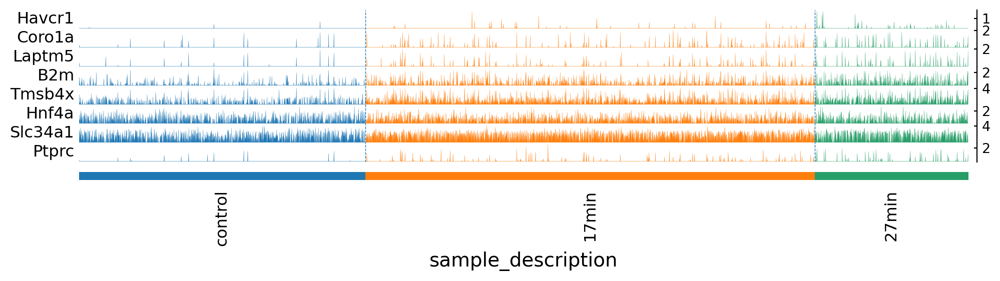

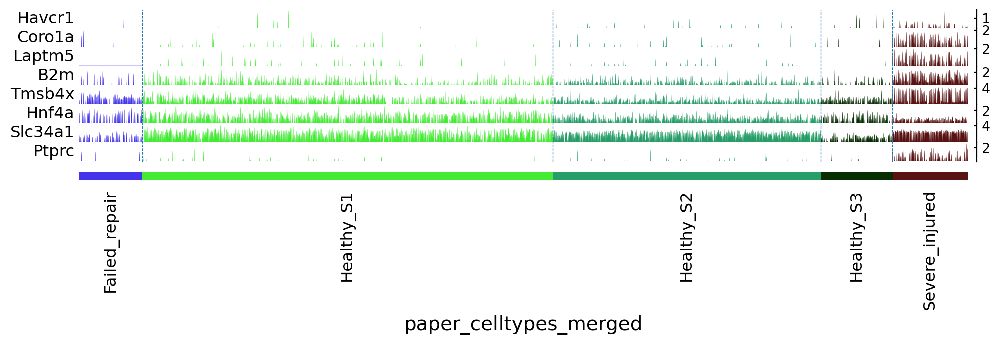

In [25]:
marker_genes= ['Havcr1','Coro1a', "Laptm5", "B2m","Tmsb4x","Hnf4a","Slc34a1","Ptprc"]
sc.pl.tracksplot(adata_pt, marker_genes, groupby='sample_description', dendrogram=False, 
                 use_raw =True)#, save="_sc_pt_persample.png")
sc.pl.tracksplot(adata_pt, marker_genes, groupby='paper_celltypes_merged', dendrogram=False,
                 use_raw =True)#, save="_sc_pt_percelltype.png")

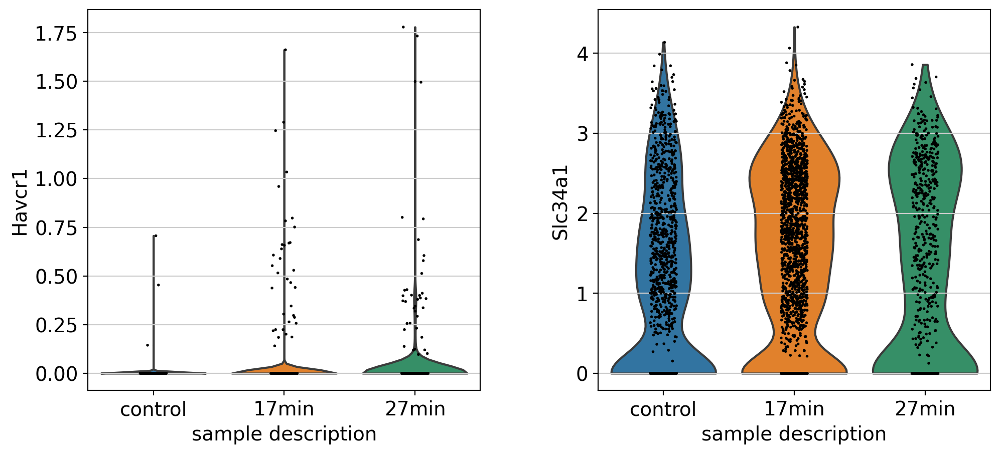

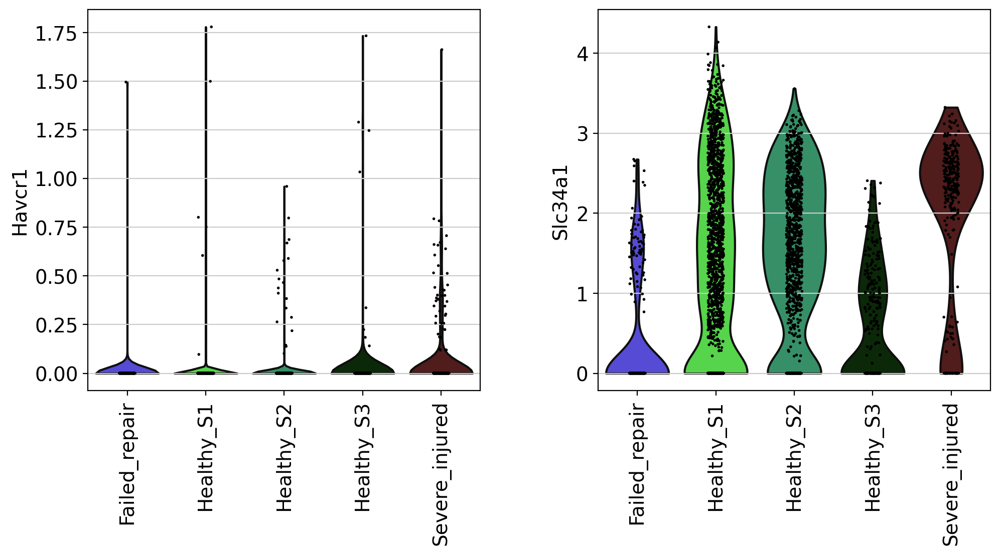

In [26]:
sc.pl.violin(adata_pt, ['Havcr1',"Slc34a1"], groupby='sample_description', size=2,
             use_raw =True)#, save="_sc_pt_sample.png" )
sc.pl.violin(adata_pt, ['Havcr1',"Slc34a1"], groupby='paper_celltypes_merged',size=2,
             rotation =90,use_raw =True)#, save="_sc_pt_celltype.png" )

## get raw count data

In [27]:
filenames = [
    config['PATHS']["DATA"]+"/N1532_N1538/outs/filtered_feature_bc_matrix/",
    config['PATHS']["DATA"]+"/N1533_N1539/outs/filtered_feature_bc_matrix/", 
    config['PATHS']["DATA"]+"/N1534_N1540/outs/filtered_feature_bc_matrix/"]
sample_string = ["N1532_N1538", "N1533_N1539", "N1534_N1540"]
sample_description= ["cell_control", "cell_17min", "cells_27min"]
sample_id = ["0","1","2"]

#read first data
adata = sc.read_10x_mtx(filenames[0], var_names="gene_symbols", cache=True)
adata.obs["sample"] = [sample_string[0]]*adata.n_obs
adata.obs["sample_description"] =  [sample_description[0]]*adata.n_obs
adata.obs["batch"] = ["batch_0"]*adata.n_obs
adata.var_names_make_unique() 
print(adata)

#read additional data
for index,filepath in enumerate(filenames[1:], start=1):
    print(index, filepath)
    adata_tmp = sc.read_10x_mtx(filepath, var_names="gene_symbols", cache=True)
    adata_tmp.obs["sample"] = [sample_string[index]]*adata_tmp.n_obs
    adata_tmp.obs["sample_id"] = [str(index)]*adata_tmp.n_obs
    adata_tmp.obs["sample_description"] =  [sample_description[index]]*adata_tmp.n_obs
    adata_tmp.obs["batch"] = ["batch_"+str(index)]*adata_tmp.n_obs
    adata_tmp.var_names_make_unique() 
    
    #concatenate to main data
    adata = adata.concatenate(adata_tmp, batch_key='sample_id')
    adata.obs.drop(columns=['sample_id'], inplace=True)

AnnData object with n_obs × n_vars = 13934 × 31053
    obs: 'sample', 'sample_description', 'batch'
    var: 'gene_ids', 'feature_types'
1 /mnt/dzl_bioinf/deluca/kidney/N1533_N1539/outs/filtered_feature_bc_matrix/
2 /mnt/dzl_bioinf/deluca/kidney/N1534_N1540/outs/filtered_feature_bc_matrix/


In [28]:
adata[adata.obs.index.isin(adata_pt.obs.index),:]

View of AnnData object with n_obs × n_vars = 3651 × 31053
    obs: 'sample', 'sample_description', 'batch'
    var: 'gene_ids', 'feature_types'

In [29]:
df =sc.pp.calculate_qc_metrics(adata[adata.obs.index.isin(adata_pt.obs.index),:], 
                           inplace=False)[1].sort_values("mean_counts",  ascending=False)#.loc[["Havcr1","Slc34a1"]]
df = df[df.mean_counts > 0]
df

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
Kap,3457,150.837860,5.022813,5.313613,550709.0,13.218964
Malat1,2761,96.656258,4.581454,24.376883,352892.0,12.773920
Fth1,3645,83.725555,4.439417,0.164339,305682.0,12.630304
mt-Atp6,3344,70.649689,4.271789,8.408655,257942.0,12.460494
mt-Co3,3376,66.824158,4.216918,7.532183,243975.0,12.404825
...,...,...,...,...,...,...
Adam32,1,0.000274,0.000274,99.972610,1.0,0.693147
5930422O12Rik,1,0.000274,0.000274,99.972610,1.0,0.693147
Gm47214,1,0.000274,0.000274,99.972610,1.0,0.693147
Phf2os1,1,0.000274,0.000274,99.972610,1.0,0.693147


In [30]:
df[df.mean_counts > 15]

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
Kap,3457,150.837860,5.022813,5.313613,550709.0,13.218964
Malat1,2761,96.656258,4.581454,24.376883,352892.0,12.773920
Fth1,3645,83.725555,4.439417,0.164339,305682.0,12.630304
mt-Atp6,3344,70.649689,4.271789,8.408655,257942.0,12.460494
mt-Co3,3376,66.824158,4.216918,7.532183,243975.0,12.404825
mt-Co2,3086,50.811012,3.947603,15.475212,185511.0,12.130875
mt-Cytb,2974,48.460968,3.901184,18.542865,176931.0,12.083521
Fxyd2,3607,41.842236,3.757524,1.205149,152766.0,11.936669
Ftl1,3615,37.022732,3.638184,0.986031,135170.0,11.814296
Tpt1,3619,33.916462,3.552958,0.876472,123829.0,11.726665


In [31]:
sc.pp.calculate_qc_metrics(adata[adata.obs.index.isin(adata_pt.obs.index),:], 
                           inplace=False)[1].loc[["Havcr1","Slc34a1"]]

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts
Havcr1,76,0.030950,0.030481,97.918379,113.0,4.736198
Slc34a1,2613,10.669131,2.456947,28.430567,38953.0,10.570137


In [32]:
print(" mean Counts per Cell: "+str(np.mean(sc.pp.calculate_qc_metrics(adata[adata.obs.index.isin(adata_pt.obs.index),:], 
                           inplace=False)[0]["total_counts"])))

 mean Counts per Cell: 4843.8716


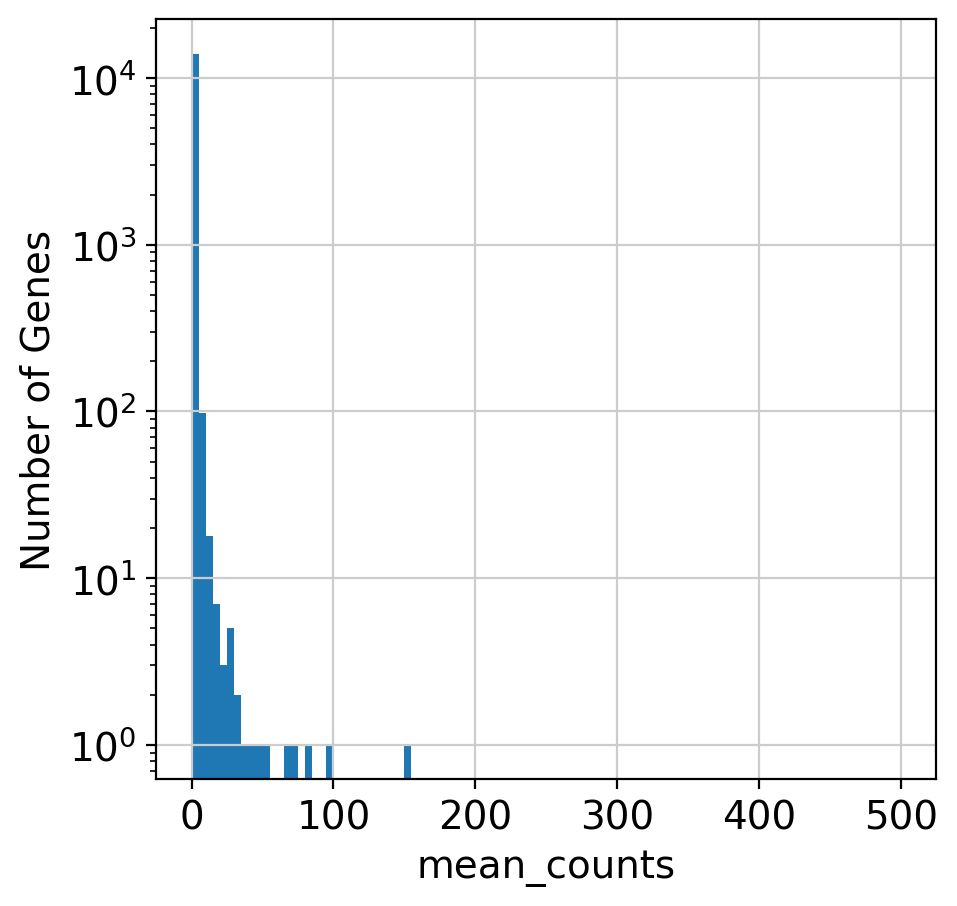

In [33]:
plt.hist(df[df.total_counts >= 5]["mean_counts"], bins=100,  range=(0, 500))
plt.yscale('log')
plt.ylabel("Number of Genes")
plt.xlabel("mean_counts")
plt.show()

/mnt/dzl_bioinf/exec/miniconda/miniconda3/envs/scRNA/lib/python3.7/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'sample' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sample_description' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'batch' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'feature_types' as categorical


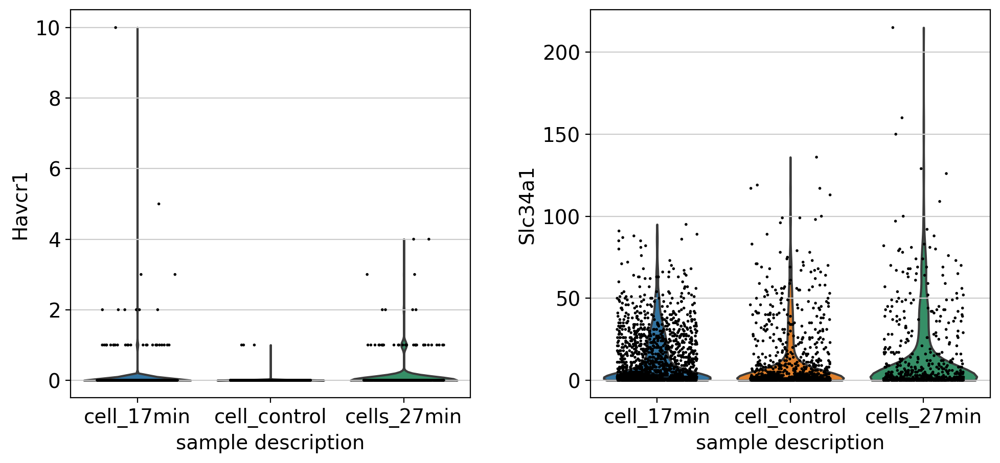

In [34]:
sc.pl.violin(adata[adata.obs.index.isin(adata_pt.obs.index),:], ['Havcr1',"Slc34a1"],
             groupby='sample_description', size=2, stripplot=True, jitter=0.3)

# Save Notebook as html

In [35]:
sc.logging.print_versions()

-----
anndata     0.7.4
scanpy      1.5.1
sinfo       0.3.1
-----
PIL                 7.2.0
anndata             0.7.4
anyio               NA
attr                21.2.0
babel               2.9.0
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
brotli              NA
cairo               1.19.1
certifi             2020.06.20
cffi                1.14.2
chardet             3.0.4
cloudpickle         1.2.2
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
dask                2.10.1
dateutil            2.8.1
decorator           4.4.2
defusedxml          0.6.0
get_version         2.1
google              NA
h5py                2.10.0
idna                2.10
igraph              0.8.2
importlib_metadata  1.7.0
ipykernel           5.3.4
ipython_genutils    0.2.0
ipywidgets          7.5.1
jedi                0.17.2
jinja2              2.11.2
joblib              1.1.0
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterla

In [36]:
%%bash
jupyter nbconvert --to html_toc script_sc_20211103_kirita_smallerClusters.ipynb --ExtractOutputPreprocessor.enabled=False
#mv script_sc_20210204_kirita.html ./script_sc_20210204_kirita.html 

[NbConvertApp] Converting notebook script_sc_20211103_kirita_smallerClusters.ipynb to html_toc
[NbConvertApp] Writing 19068900 bytes to script_sc_20211103_kirita_smallerClusters.html
